In [262]:

import pandas as pd

df_issue_all = pd.read_csv('data/templates_repo.csv')
df_issue = pd.read_csv('data/individual_issue_contents.csv')
df_pr = pd.read_csv('data/individual_pr_contents.csv')
df_issue_scores = pd.read_csv('data/issue_scores.csv')
df_pr_scores = pd.read_csv('data/pr_scores.csv')

In [263]:
df_issue_all.columns

Index(['primaryLanguage', 'description', 'hasWikiEnabled', 'stargazerCount',
       'pull_request_files', 'issue_files', 'nameWithOwner', 'owner',
       'issue_files_to_str', 'pull_request_files_to_str'],
      dtype='object')

In [264]:

df_issue_scores.columns
df_pr_scores = pd.merge(df_issue_all, df_pr_scores, left_on='nameWithOwner', right_on='repo_name')
df_issue_scores = pd.merge(df_issue_all, df_issue_scores, left_on='nameWithOwner', right_on='repo_name')

In [300]:
# unique languages 
langs = df_issue_scores['primaryLanguage'].unique()
print(len(langs))
    

25


In [266]:

import os
issue_path = 'data/langs/issues'
file_list = os.listdir(issue_path)

for file_name in file_list:
    if file_name.startswith('issue_scores_') and file_name.endswith('.csv'):
        # Extract the language from the file name
        language = file_name[len('issue_scores_'):-len('.csv')]
        
        # Construct the full file path
        file_path = os.path.join(issue_path, file_name)
        
        # Load the CSV file into a dataframe as df_{language}_issue
        globals()['df_{}_issue'.format(language)] = pd.read_csv(file_path)
        
        # remove the duplicates based on 'issue_file' column 
        globals()['df_{}_issue'.format(language)] = globals()['df_{}_issue'.format(language)].drop_duplicates(subset=['issue_file'])
        
        # save it to a csv file back 
        globals()['df_{}_issue'.format(language)].to_csv(file_path, index=False)
        
        

In [267]:

import os
issue_pr = 'data/langs/pr'
file_list = os.listdir(issue_pr)

for file_name in file_list:
    if file_name.startswith('pr_scores_') and file_name.endswith('.csv'):
        # Extract the language from the file name
        language = file_name[len('pr_scores_'):-len('.csv')]
        
        # Construct the full file path
        file_path = os.path.join(issue_pr, file_name)
        
        # Load the CSV file into a dataframe as df_{language}_issue
        globals()['df_{}_pr'.format(language)] = pd.read_csv(file_path)
        
        # remove the duplicates based on 'issue_file' column 
        globals()['df_{}_pr'.format(language)] = globals()['df_{}_pr'.format(language)].drop_duplicates(subset=['pr_file'])
        
        # save it to a csv file back 
        globals()['df_{}_pr'.format(language)].to_csv(file_path, index=False)
        

In [268]:
lang_wise_scores = {}

for language in langs:
    print(language)
    print('Number of Repos', globals()['df_{}_issue'.format(language)].nameWithOwner.unique().shape[0])
    print('Number of Issues', globals()['df_{}_issue'.format(language)].shape[0])
    print('Average Number of Issues per Repo', globals()['df_{}_issue'.format(language)].shape[0]/globals()['df_{}_issue'.format(language)].nameWithOwner.unique().shape[0])
    print('Number of Repos', globals()['df_{}_pr'.format(language)].nameWithOwner.unique().shape[0])
    print('Number of PR', globals()['df_{}_pr'.format(language)].shape[0])
    print('Average Number of PR per Repo', globals()['df_{}_pr'.format(language)].shape[0]/globals()['df_{}_pr'.format(language)].nameWithOwner.unique().shape[0])
    print('\n')
    globals()['df_{}_pr'.format(language)] = pd.merge(globals()['df_{}_pr'.format(language)], df_pr_scores, left_on='nameWithOwner', right_on='nameWithOwner')
    globals()['df_{}_pr'.format(language)] = globals()['df_{}_pr'.format(language)].drop(columns=['Supporting Information_x', 'References_x'])
    print('\n')
    globals()['df_{}_issue'.format(language)] = pd.merge(globals()['df_{}_issue'.format(language)], df_issue_scores, left_on='nameWithOwner', right_on='nameWithOwner')
    globals()['df_{}_issue'.format(language)] = globals()['df_{}_issue'.format(language)].drop(columns=['Supporting Information_x', 'References_x'])
    addition_context_average_issue = globals()['df_{}_issue'.format(language)]['Additional context_y'].mean() * 100
    steps_to_reproduce_average_issue = globals()['df_{}_issue'.format(language)]['Steps to reproduce_y'].mean() * 100
    expected_actual_behavior_average_issue = globals()['df_{}_issue'.format(language)]['Expected/Actual behavior_y'].mean() * 100
    type_average_issue = globals()['df_{}_issue'.format(language)]['Type_y'].mean() * 100
    screenshot_average_issue = globals()['df_{}_issue'.format(language)]['Screenshot_y'].mean() * 100
    log_average_issue = globals()['df_{}_issue'.format(language)]['Log_y'].mean() * 100
    summary_average_issue = globals()['df_{}_issue'.format(language)]['Summary_y'].mean() * 100
    severity_average_issue = globals()['df_{}_issue'.format(language)]['Severity_y'].mean() * 100
    environment_average_issue = globals()['df_{}_issue'.format(language)]['Environment_y'].mean() * 100
    documentation_testing_average_issue = globals()['df_{}_issue'.format(language)]['Documentation and Testing_y'].mean() * 100
    issue_problem_description_average_issue = globals()['df_{}_issue'.format(language)]['Issue/Problem Description_y'].mean() * 100
    proposed_solutions_suggestions_average_issue = globals()['df_{}_issue'.format(language)]['Proposed Solutions and Suggestions_y'].mean() * 100
    impact_assessment_average_issue = globals()['df_{}_issue'.format(language)]['Impact Assessment_y'].mean() * 100
    submission_guidelines_formatting_average_issue = globals()['df_{}_issue'.format(language)]['Submission Guidelines and Formatting_y'].mean() * 100
    collaboration_review_average_issue = globals()['df_{}_issue'.format(language)]['Collaboration and Review_y'].mean() * 100
    debugging_information_average_issue = globals()['df_{}_issue'.format(language)]['Debugging Information_y'].mean() * 100
    greeting_introduction_average_issue = globals()['df_{}_issue'.format(language)]['Greeting and Introduction_y'].mean() * 100
    
    # print top 3 percentiles and bottom 3 percentiles that we calculated in the previous step
    print('Top 3 Percentiles')
    all_issue_scores = {'addition_context': addition_context_average_issue, 'steps_to_reproduce': steps_to_reproduce_average_issue, 'expected_actual_behavior': expected_actual_behavior_average_issue, 'type': type_average_issue, 'screenshot': screenshot_average_issue, 'log': log_average_issue, 'summary': summary_average_issue, 'severity': severity_average_issue, 'environment': environment_average_issue, 'documentation_testing': documentation_testing_average_issue, 'issue_problem_description': issue_problem_description_average_issue, 'proposed_solutions_suggestions': proposed_solutions_suggestions_average_issue, 'impact_assessment': impact_assessment_average_issue, 'submission_guidelines_formatting': submission_guidelines_formatting_average_issue, 'collaboration_review': collaboration_review_average_issue, 'debugging_information': debugging_information_average_issue, 'greeting_introduction': greeting_introduction_average_issue}
    # sort the dictionary based on values
    all_issue_scores = sorted(all_issue_scores.items(), key=lambda x: x[1], reverse=True)
    # print top 3 and bottom 3
    print(all_issue_scores[:3])
    print('Bottom 3 Percentiles')
    print(all_issue_scores[-3:])
    

    addition_context_average_pr = globals()['df_{}_pr'.format(language)]['Additional context_y'].mean() * 100
    steps_to_reproduce_average_pr = globals()['df_{}_pr'.format(language)]['Steps to reproduce_y'].mean() * 100
    expected_actual_behavior_average_pr = globals()['df_{}_pr'.format(language)]['Expected/Actual behavior_y'].mean() * 100
    type_average_pr = globals()['df_{}_pr'.format(language)]['Type_y'].mean() * 100
    screenshot_average_pr = globals()['df_{}_pr'.format(language)]['Screenshot_y'].mean() * 100
    log_average_pr = globals()['df_{}_pr'.format(language)]['Log_y'].mean() * 100
    summary_average_pr = globals()['df_{}_pr'.format(language)]['Summary_y'].mean() * 100
    severity_average_pr = globals()['df_{}_pr'.format(language)]['Severity_y'].mean() * 100
    environment_average_pr = globals()['df_{}_pr'.format(language)]['Environment_y'].mean() * 100
    documentation_testing_average_pr = globals()['df_{}_pr'.format(language)]['Documentation and Testing_y'].mean() * 100
    issue_problem_description_average_pr = globals()['df_{}_pr'.format(language)]['Issue/Problem Description_y'].mean() * 100
    proposed_solutions_suggestions_average_pr = globals()['df_{}_pr'.format(language)]['Proposed Solutions and Suggestions_y'].mean() * 100
    impact_assessment_average_pr = globals()['df_{}_pr'.format(language)]['Impact Assessment_y'].mean() * 100
    submission_guidelines_formatting_average_pr = globals()['df_{}_pr'.format(language)]['Submission Guidelines and Formatting_y'].mean() * 100
    collaboration_review_average_pr = globals()['df_{}_pr'.format(language)]['Collaboration and Review_y'].mean() * 100
    debugging_information_average_pr = globals()['df_{}_pr'.format(language)]['Debugging Information_y'].mean() * 100
    greeting_introduction_average_pr = globals()['df_{}_pr'.format(language)]['Greeting and Introduction_y'].mean() * 100
    
    print('Top 3 Percentiles')
    all_pr_scores = {'addition_context': addition_context_average_pr, 'steps_to_reproduce': steps_to_reproduce_average_pr, 'expected_actual_behavior': expected_actual_behavior_average_pr, 'type': type_average_pr, 'screenshot': screenshot_average_pr, 'log': log_average_pr, 'summary': summary_average_pr, 'severity': severity_average_pr, 'environment': environment_average_pr, 'documentation_testing': documentation_testing_average_pr, 'issue_problem_description': issue_problem_description_average_pr, 'proposed_solutions_suggestions': proposed_solutions_suggestions_average_pr, 'impact_assessment': impact_assessment_average_pr, 'submission_guidelines_formatting': submission_guidelines_formatting_average_pr, 'collaboration_review': collaboration_review_average_pr, 'debugging_information': debugging_information_average_pr, 'greeting_introduction_average_pr': greeting_introduction_average_pr}
    all_pr_scores = sorted(all_pr_scores.items(), key=lambda x: x[1], reverse=True)
    print(all_pr_scores[:3])
    print('Bottom 3 Percentiles')
    print(all_pr_scores[-3:])
    
    lang_wise_scores[language] = {'issue': all_issue_scores, 'pr': all_pr_scores}

JavaScript
Number of Repos 28
Number of Issues 48
Average Number of Issues per Repo 1.7142857142857142
Number of Repos 6
Number of PR 8
Average Number of PR per Repo 1.3333333333333333




Top 3 Percentiles
[('addition_context', 23.004138992982238), ('issue_problem_description', 21.052223442281086), ('steps_to_reproduce', 16.12691208801616)]
Bottom 3 Percentiles
[('log', 3.847375045415812), ('severity', 3.287881246408743), ('environment', 3.0368210892835013)]
Top 3 Percentiles
[('addition_context', 26.249612741719908), ('issue_problem_description', 11.105961266299397), ('collaboration_review', 10.846503264234073)]
Bottom 3 Percentiles
[('screenshot', 4.033847123594655), ('severity', 3.9577553818955065), ('environment', 2.9239240722660167)]
None
Number of Repos 4
Number of Issues 9
Average Number of Issues per Repo 2.25
Number of Repos 2
Number of PR 2
Average Number of PR per Repo 1.0




Top 3 Percentiles
[('addition_context', 17.86961866759159), ('issue_problem_description', 17.80573

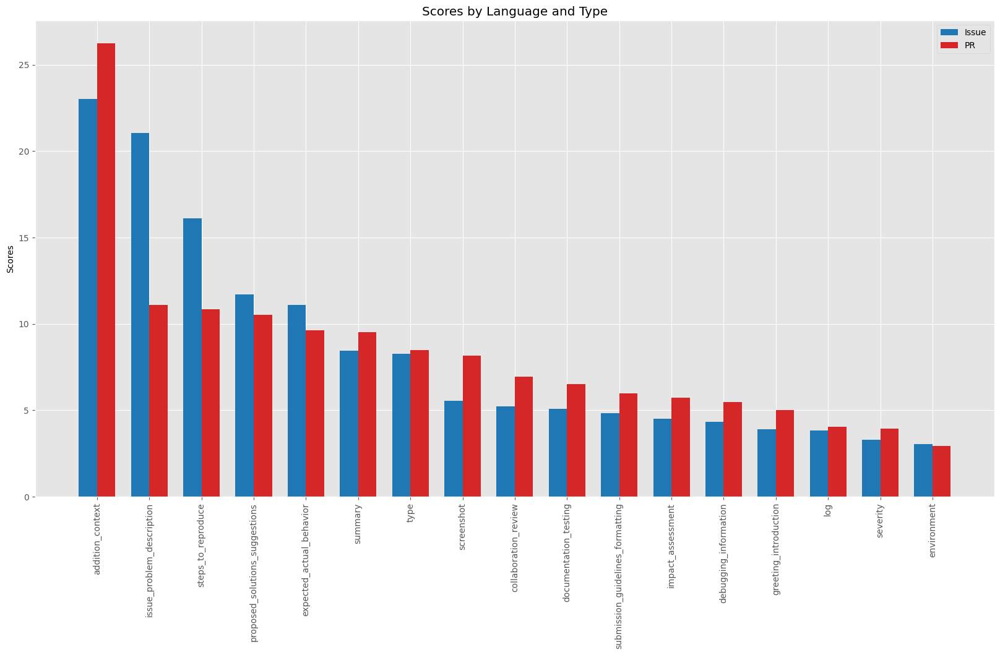

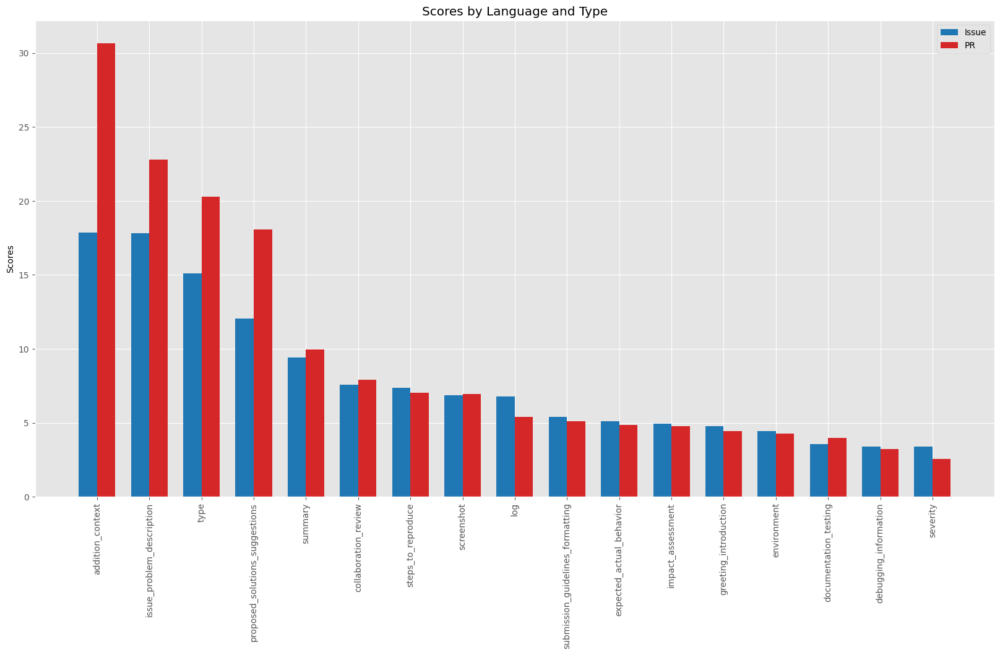

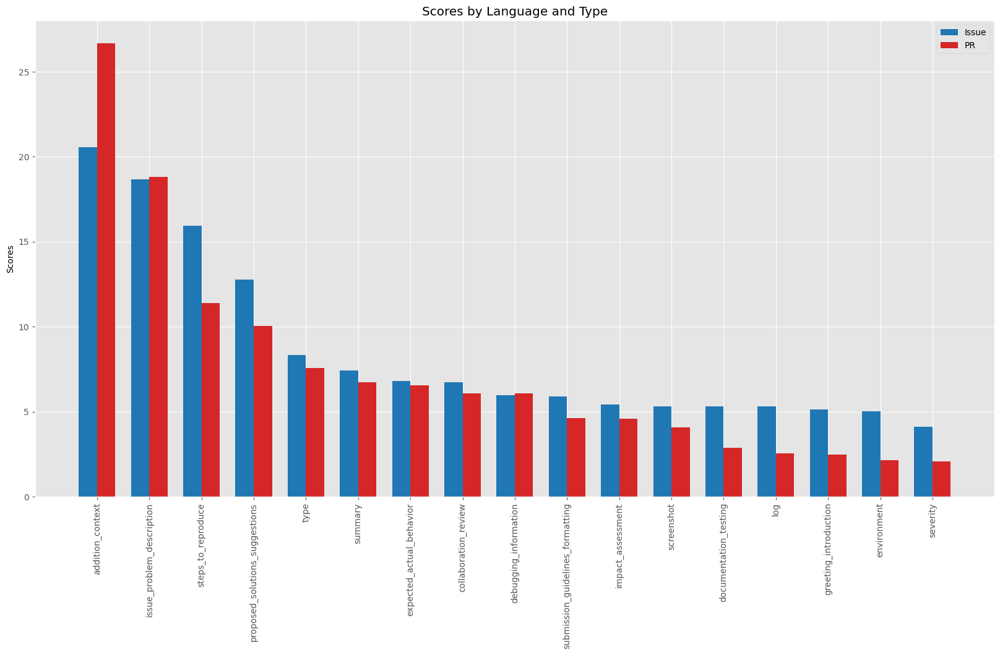

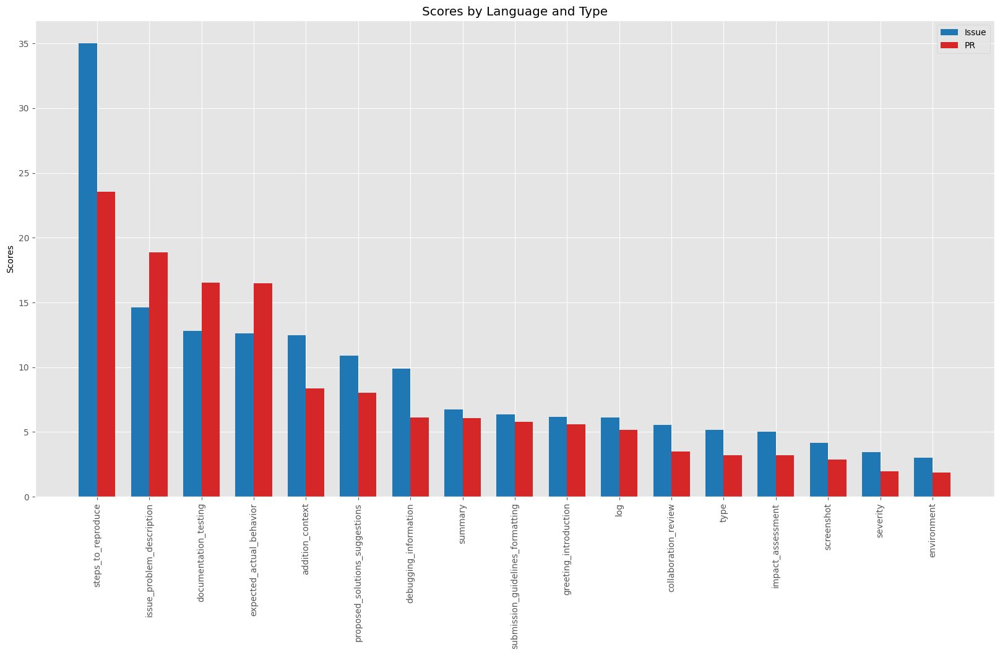

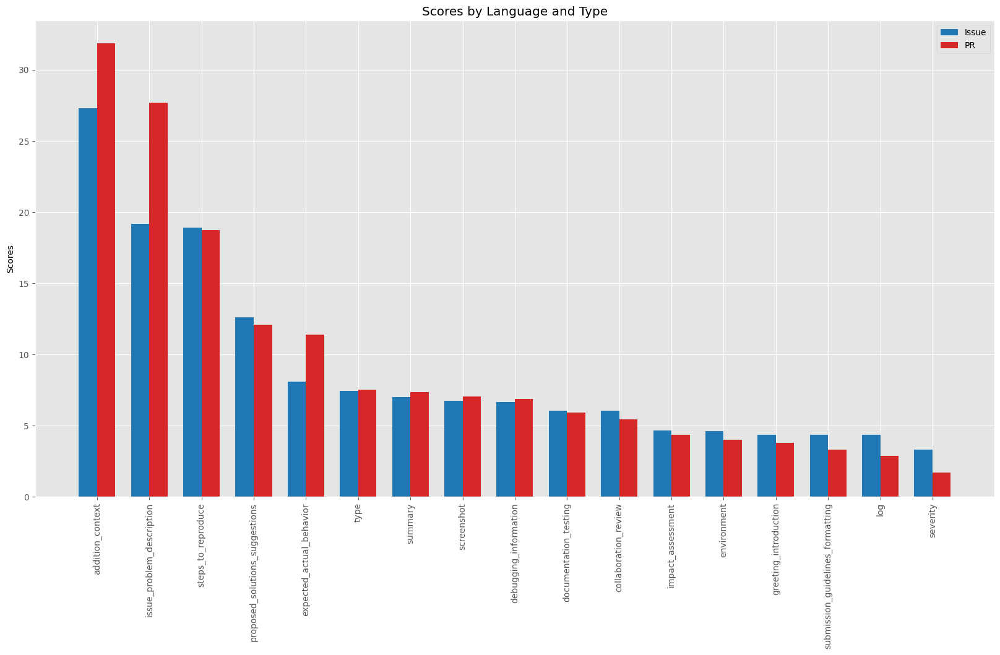

...

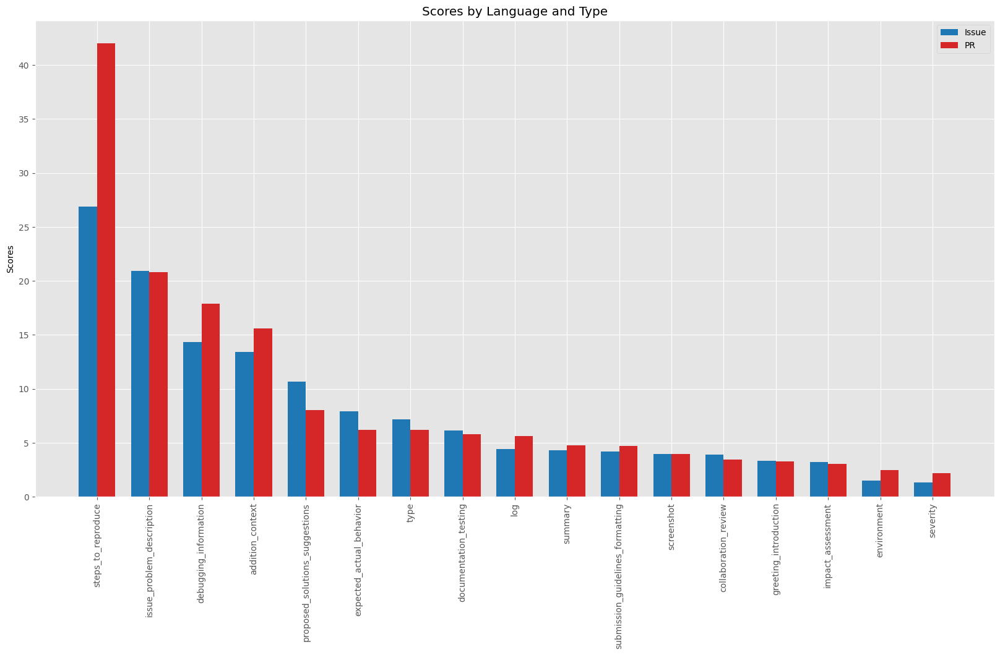

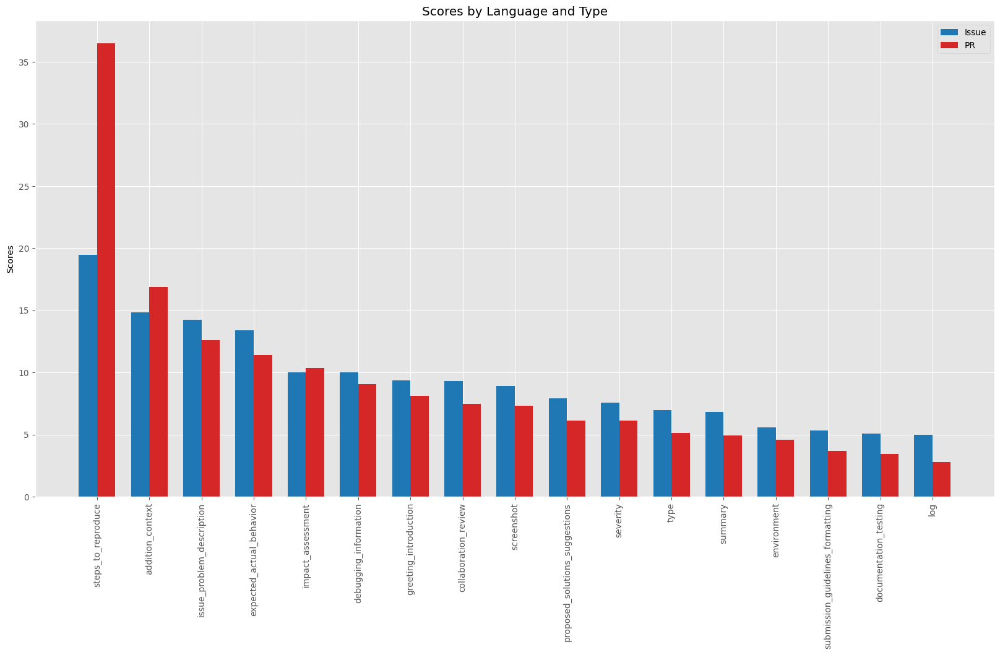

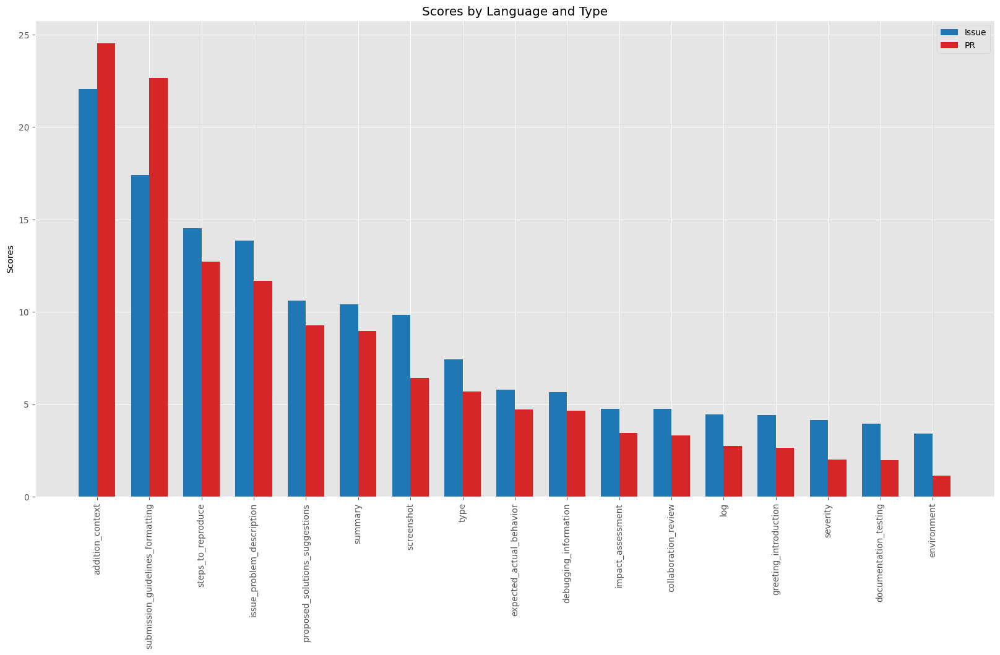

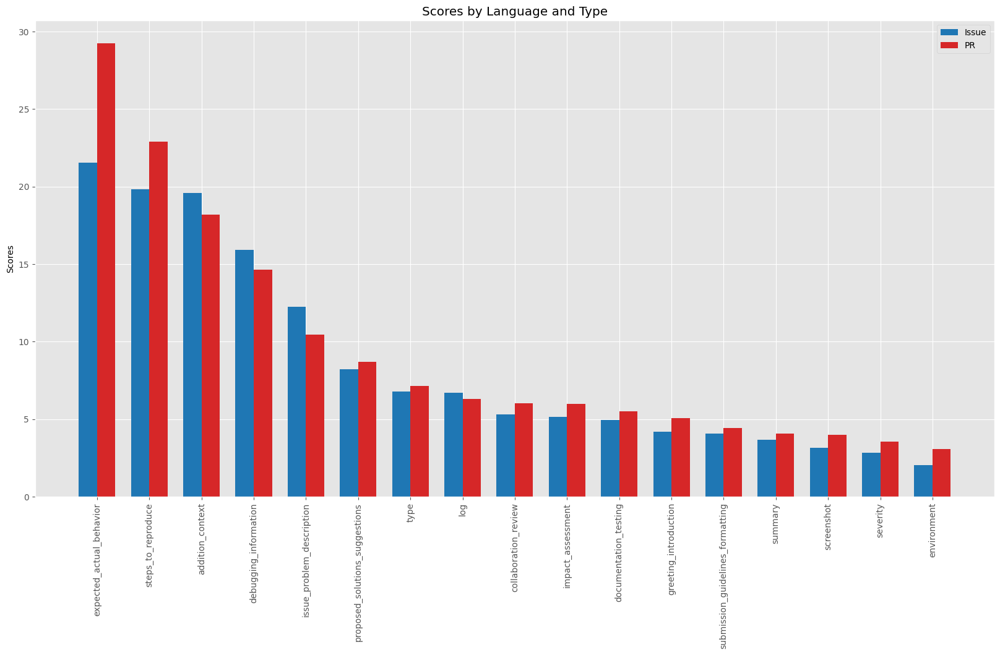

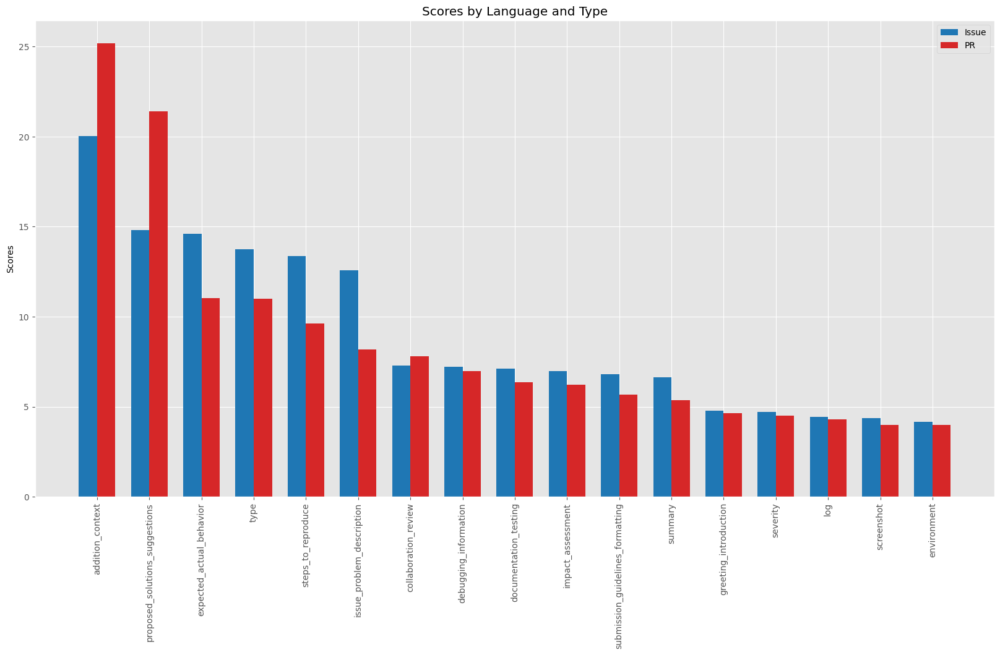

In [269]:
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')
# change font style 
plt.rcParams['font.family'] = 'sans-serif'
for language in langs:
    categories_issue = [lang_wise_scores[language]['issue'][i][0] for i in range(len(lang_wise_scores[language]['issue']))]
    scores_issue = [lang_wise_scores[language]['issue'][i][1] for i in range(len(lang_wise_scores[language]['issue']))]
    categories_pr = [lang_wise_scores[language]['pr'][i][0] for i in range(len(lang_wise_scores[language]['pr']))]
    scores_pr = [lang_wise_scores[language]['pr'][i][1] for i in range(len(lang_wise_scores[language]['pr']))]
    
    bar_width = 0.35
    fig, ax = plt.subplots(figsize=(20, 10))
    index = np.arange(len(categories_issue))
    ax.bar(index, scores_issue, bar_width, label='Issue', color='tab:blue')
    ax.bar(index + bar_width, scores_pr, bar_width, label='PR', color='tab:red')
    ax.set_ylabel('Scores')
    ax.set_title('Scores by Language and Type')
    ax.legend()

    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(categories_issue)
    plt.xticks(rotation=90)

    plt.show() 


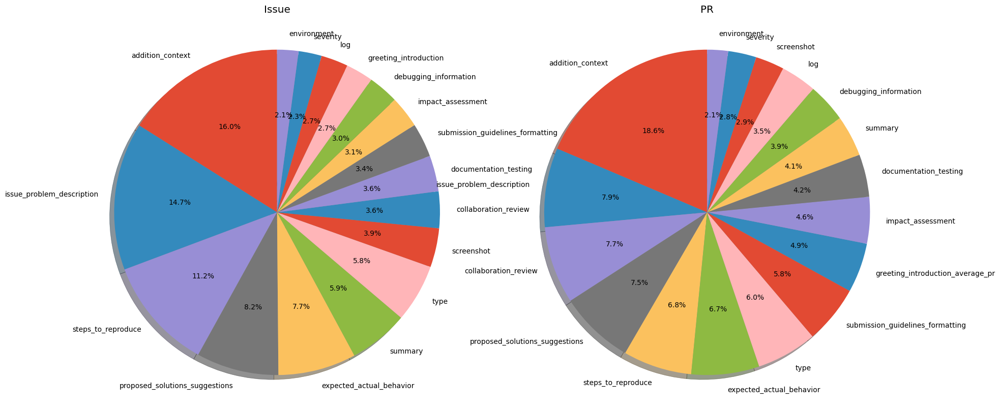

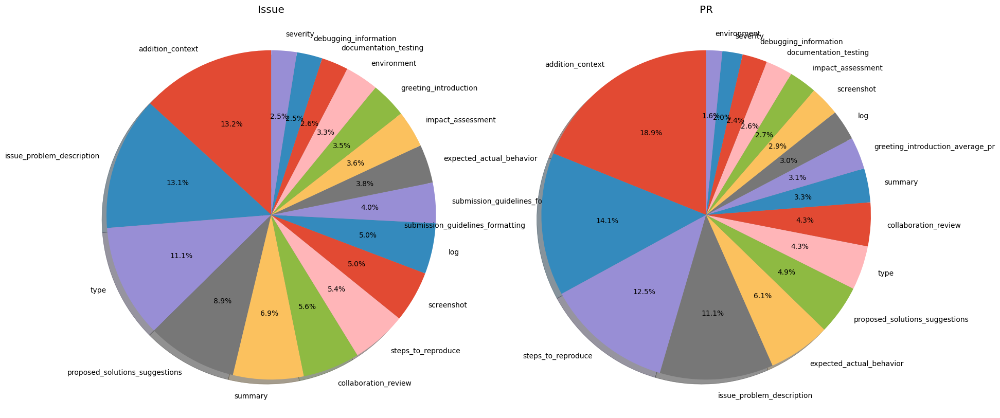

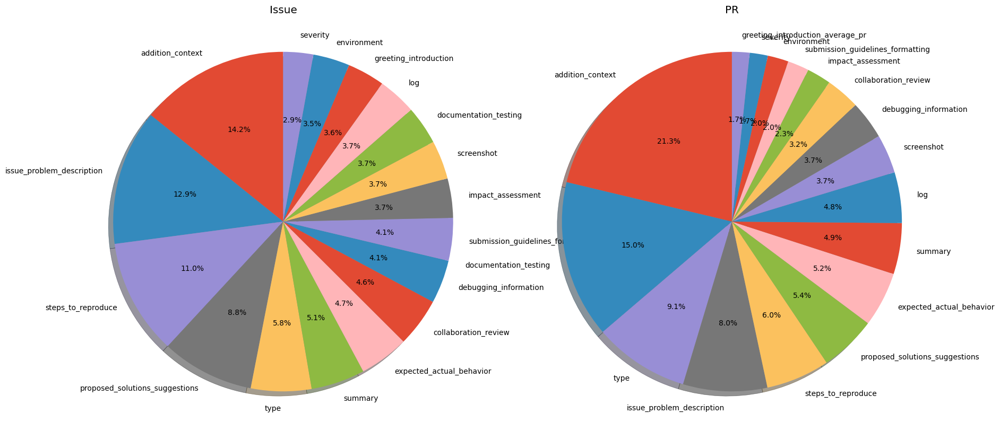

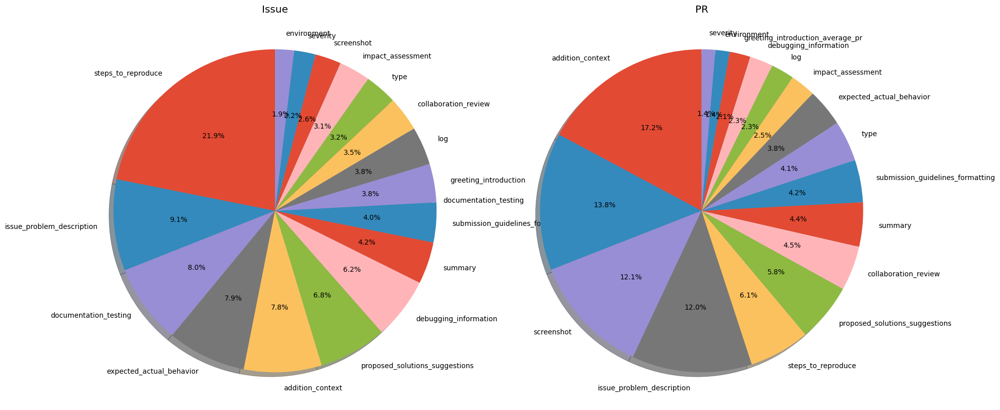

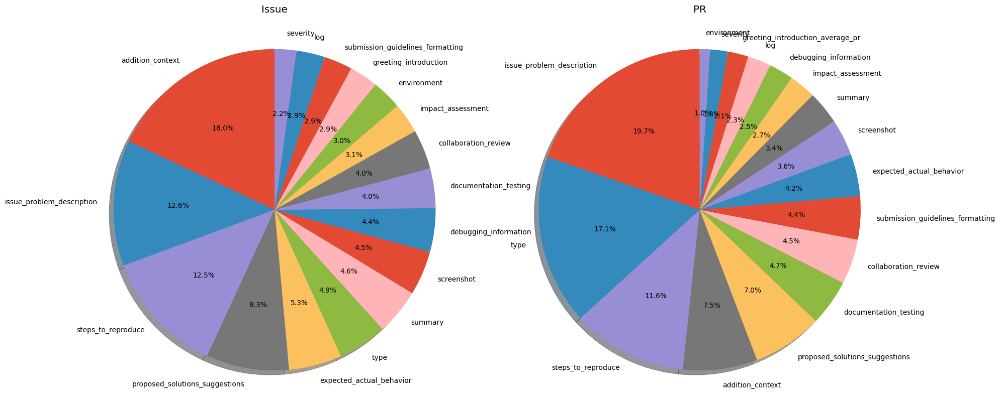

...

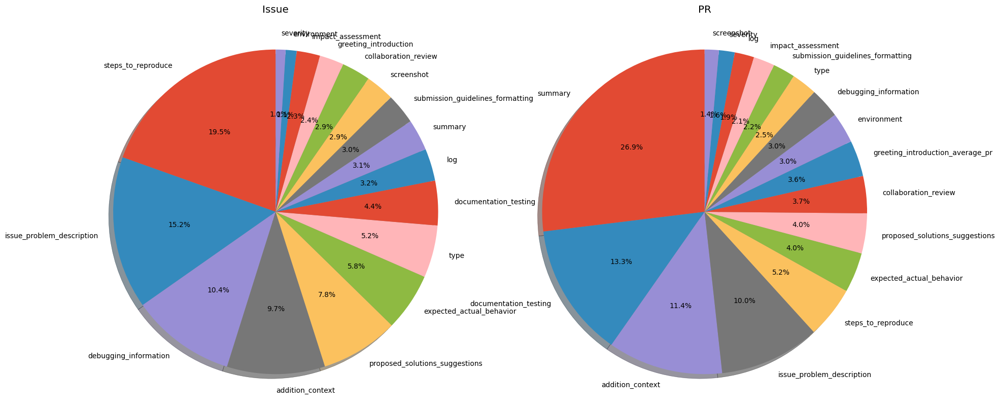

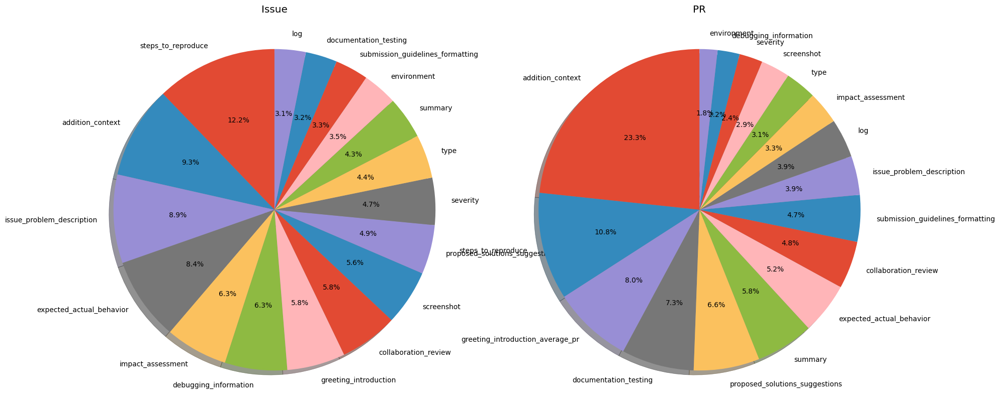

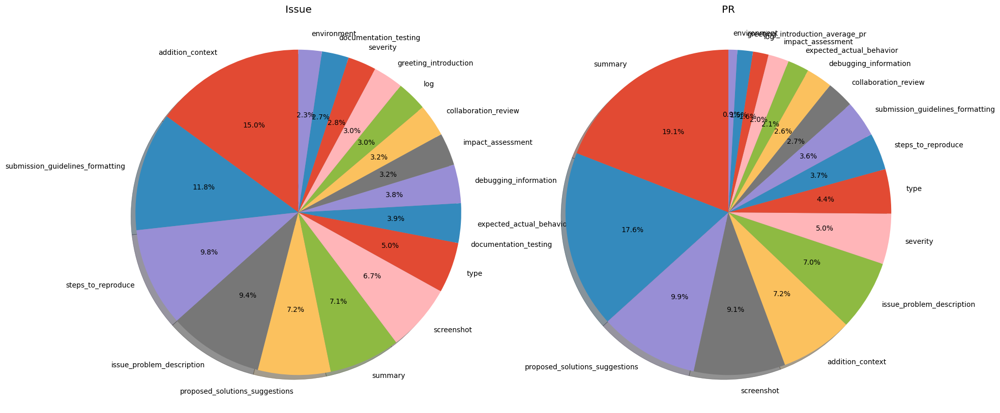

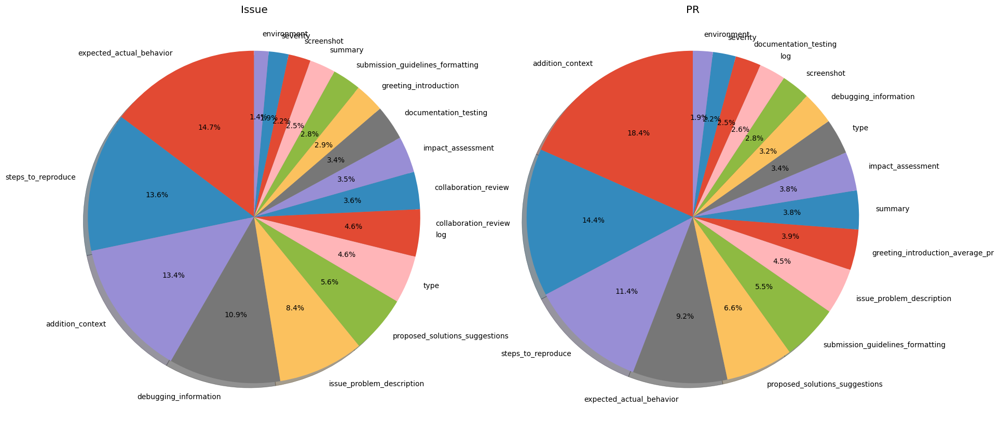

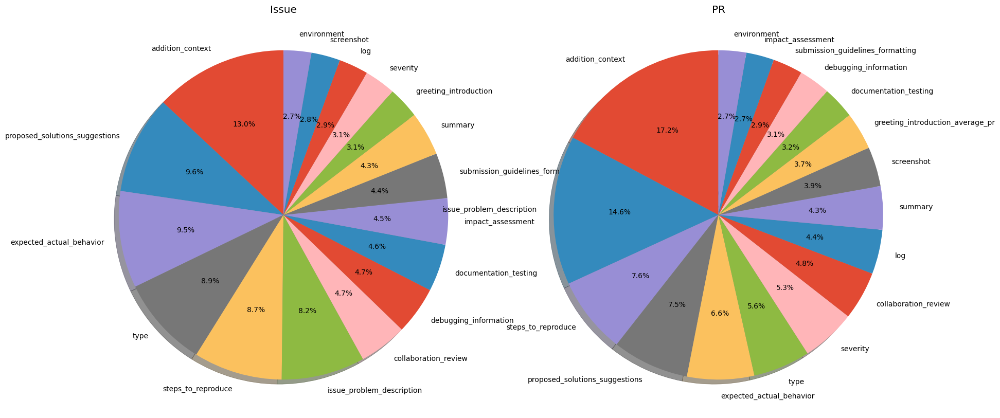

In [270]:
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')
# change font style 
plt.rcParams['font.family'] = 'sans-serif'
for language in langs:
    categories_issue = [lang_wise_scores[language]['issue'][i][0] for i in range(len(lang_wise_scores[language]['issue']))]
    scores_issue = [lang_wise_scores[language]['issue'][i][1] for i in range(len(lang_wise_scores[language]['issue']))]
    categories_pr = [lang_wise_scores[language]['pr'][i][0] for i in range(len(lang_wise_scores[language]['pr']))]
    scores_pr = [lang_wise_scores[language]['pr'][i][1] for i in range(len(lang_wise_scores[language]['pr']))]
    
    # put two pie charts side by side one for issue and one for pr
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.pie(scores_issue, labels=categories_issue, autopct='%1.1f%%', shadow=True, startangle=90)
    ax1.axis('equal')
    ax1.set_title('Issue')
    ax2.pie(scores_pr, labels=categories_pr, autopct='%1.1f%%', shadow=True, startangle=90)
    ax2.axis('equal')
    ax2.set_title('PR')
    plt.show()
    
    


Overall Average Scores for All Labels: Issue
[('issue_problem_description', 21.304173652768913), ('addition_context', 19.68504409427702), ('steps_to_reproduce', 18.19355613354716), ('proposed_solutions_suggestions', 16.687262011246634), ('screenshot', 12.428484886887114), ('expected_actual_behavior', 7.677928521427444), ('debugging_information', 7.63049743833352), ('type', 7.26562183915473), ('summary', 6.475550431058661), ('documentation_testing', 6.089726655614616), ('log', 5.2137751160494945), ('submission_guidelines_formatting', 4.946571643879), ('collaboration_review', 4.437470342131794), ('environment', 4.114288093021234), ('impact_assessment', 3.8715736927689535), ('greeting_introduction', 3.696088618049074), ('severity', 3.2873855571333195)]
Overall Average Scores for All Labels: PR
[('addition_context', 22.698041833138472), ('issue_problem_description', 14.698207581793765), ('documentation_testing', 13.871491426832536), ('steps_to_reproduce', 11.219742335624005), ('screenshot'

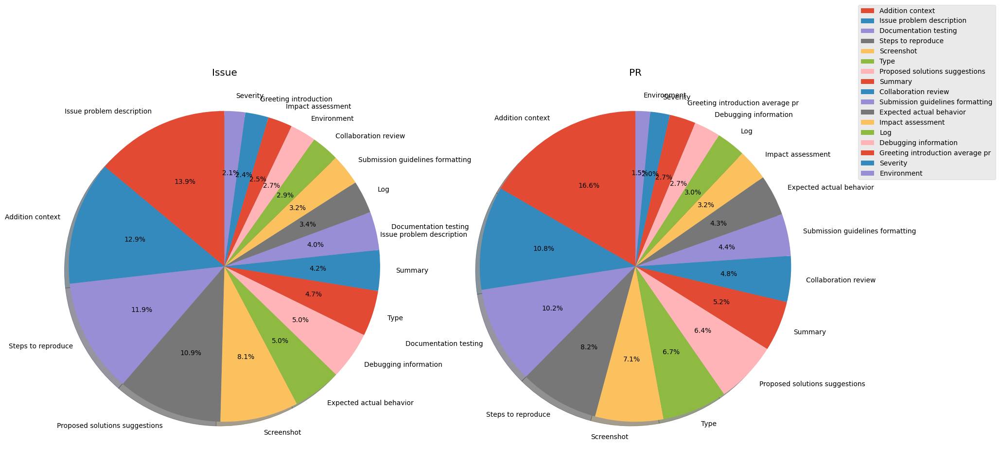

In [296]:

frontend_languages = ['JavaScript', 'TypeScript', 'Dart', 'CSS', 'HTML', 'SCSS']
backend_languages = ['Python', 'Go', 'Ruby', 'PHP', 'Kotlin', 'Java', 'Rust', 'C#', 'C++', 'C']
system_languages = ['Assembly', 'Swift', 'OCaml']
other_languages = ['Markdown', 'Jupyter Notebook', 'Shell', 'Clojure', 'None']

frontend_langs_score = {}
total_label_score = {}

overall_label_score = {}
overall_pr_score = {}

# Iterate over each language
for language in frontend_languages:
    frontend_langs_score[language] = lang_wise_scores[language]
    
    labels = [score[0] for score in frontend_langs_score[language]['issue']]
    scores = [score[1] for score in frontend_langs_score[language]['issue']]
    
    labels_pr = [score[0] for score in frontend_langs_score[language]['pr']]
    scores_pr = [score[1] for score in frontend_langs_score[language]['pr']]
    
    # Calculate the total score for each label
    for i in range(len(labels)):
        label = labels[i]
        score = scores[i]
        if label not in overall_label_score:
            overall_label_score[label] = 0
        overall_label_score[label] += score
    for i in range(len(labels_pr)):
        label = labels_pr[i]
        score = scores_pr[i]
        if label not in overall_pr_score:
            overall_pr_score[label] = 0
        overall_pr_score[label] += score

# Calculate the average score for each label
total_languages = len(frontend_languages)
for label in overall_label_score:
    overall_label_score[label] /= total_languages

for label in overall_pr_score:
    overall_pr_score[label] /= total_languages

# Sort the dictionary based on values
overall_label_score = sorted(overall_label_score.items(), key=lambda x: x[1], reverse=True)

overall_pr_score = sorted(overall_pr_score.items(), key=lambda x: x[1], reverse=True)

print("Overall Average Scores for All Labels: Issue")
print(overall_label_score)
print("Overall Average Scores for All Labels: PR")
print(overall_pr_score)

# plot two pie charts side by side

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')
# change font style
plt.rcParams['font.family'] = 'sans-serif'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.pie([score[1] for score in overall_label_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_label_score], autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

ax1.set_title('Issue')
ax2.pie([score[1] for score in overall_pr_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_pr_score], autopct='%1.1f%%', shadow=True, startangle=90)
ax2.axis('equal')
ax2.set_title('PR')
# put the legend on the right side and outside of the pie chart, not overlapping
ax2.legend(bbox_to_anchor=(1.15, 1.2), loc='upper left', borderaxespad=0.)
ax1.set_title('Issue')
ax2.set_title('PR')
ax1.axis('equal')
ax2.axis('equal')
plt.show()

Overall Average Scores for All Labels: Issue
[('addition_context', 19.922290795874293), ('issue_problem_description', 16.410721599365424), ('steps_to_reproduce', 16.02500004227837), ('proposed_solutions_suggestions', 11.409049344945451), ('expected_actual_behavior', 10.169380332259653), ('debugging_information', 9.199429583349652), ('summary', 8.326067540390564), ('type', 8.061507122393738), ('submission_guidelines_formatting', 6.224347321323889), ('collaboration_review', 6.08111038982062), ('screenshot', 5.923918275889148), ('log', 5.543443013843914), ('impact_assessment', 5.412099854479163), ('documentation_testing', 5.237388063970353), ('greeting_introduction', 5.005260457716582), ('severity', 4.211740355314579), ('environment', 3.877261507064045)]
Overall Average Scores for All Labels: PR
[('addition_context', 23.852556504673892), ('documentation_testing', 13.001680874989685), ('summary', 12.858687048199021), ('steps_to_reproduce', 12.675987866122997), ('collaboration_review', 10.5

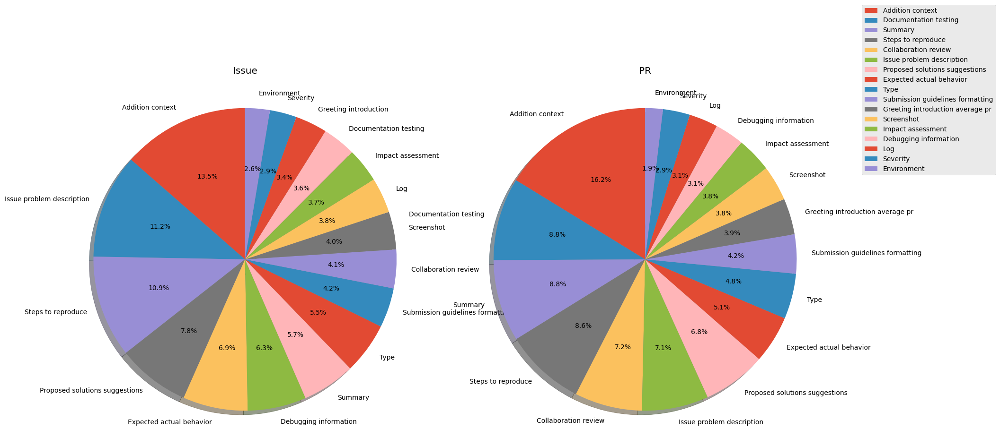

In [297]:

backend_languages = ['Python', 'Go', 'Ruby', 'PHP', 'Kotlin', 'Java', 'Rust', 'C#', 'C++', 'C']
system_languages = ['Assembly', 'Swift', 'OCaml']
other_languages = ['Markdown', 'Jupyter Notebook', 'Shell', 'Clojure', 'None']

backend_langs_score = {}
total_label_score = {}

overall_label_score = {}
overall_pr_score = {}

# Iterate over each language
for language in backend_languages:
    backend_langs_score[language] = lang_wise_scores[language]
    
    labels = [score[0] for score in backend_langs_score[language]['issue']]
    scores = [score[1] for score in backend_langs_score[language]['issue']]
    
    labels_pr = [score[0] for score in backend_langs_score[language]['pr']]
    scores_pr = [score[1] for score in backend_langs_score[language]['pr']]
    
    # Calculate the total score for each label
    for i in range(len(labels)):
        label = labels[i]
        score = scores[i]
        if label not in overall_label_score:
            overall_label_score[label] = 0
        overall_label_score[label] += score
    for i in range(len(labels_pr)):
        label = labels_pr[i]
        score = scores_pr[i]
        if label not in overall_pr_score:
            overall_pr_score[label] = 0
        overall_pr_score[label] += score

# Calculate the average score for each label
total_languages = len(backend_languages)
for label in overall_label_score:
    overall_label_score[label] /= total_languages

for label in overall_pr_score:
    overall_pr_score[label] /= total_languages

# Sort the dictionary based on values
overall_label_score = sorted(overall_label_score.items(), key=lambda x: x[1], reverse=True)

overall_pr_score = sorted(overall_pr_score.items(), key=lambda x: x[1], reverse=True)

print("Overall Average Scores for All Labels: Issue")
print(overall_label_score)
print("Overall Average Scores for All Labels: PR")
print(overall_pr_score)

# plot two pie charts side by side

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')
# change font style
plt.rcParams['font.family'] = 'sans-serif'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.pie([score[1] for score in overall_label_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_label_score], autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

ax1.set_title('Issue')
ax2.pie([score[1] for score in overall_pr_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_pr_score], autopct='%1.1f%%', shadow=True, startangle=90)
ax2.axis('equal')
ax2.set_title('PR')
# put the legend on the right side and outside of the pie chart, not overlapping
ax2.legend(bbox_to_anchor=(1.15, 1.2), loc='upper left', borderaxespad=0.)
ax1.set_title('Issue')
ax2.set_title('PR')
ax1.axis('equal')
ax2.axis('equal')
plt.show()

Overall Average Scores for All Labels: Issue
[('steps_to_reproduce', 19.545700507411876), ('addition_context', 18.346990384383517), ('proposed_solutions_suggestions', 14.432813617213364), ('issue_problem_description', 12.088972631430252), ('expected_actual_behavior', 10.222446131513566), ('collaboration_review', 9.661151734118825), ('environment', 9.407922001295075), ('type', 9.339383181213563), ('submission_guidelines_formatting', 8.869221015478463), ('summary', 7.07272144988459), ('impact_assessment', 5.771570134308427), ('documentation_testing', 5.492954019086448), ('debugging_information', 5.44434931660425), ('greeting_introduction', 4.680968190243156), ('log', 4.468804938289093), ('screenshot', 4.198608373704709), ('severity', 3.4741464969588876)]
Overall Average Scores for All Labels: PR
[('addition_context', 31.231586925223866), ('issue_problem_description', 23.538114647715258), ('steps_to_reproduce', 17.707935211522507), ('proposed_solutions_suggestions', 10.72349065700463), ('

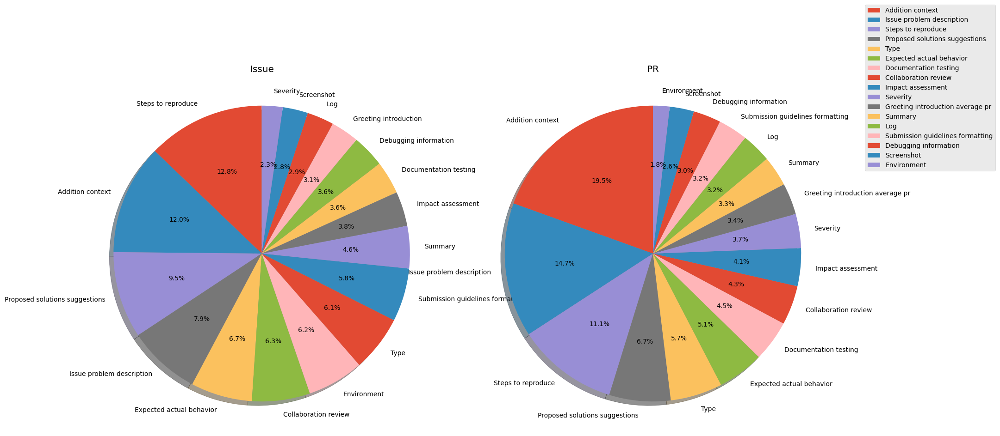

In [298]:
system_languages = ['Assembly', 'Swift', 'OCaml']
other_languages = ['Markdown', 'Jupyter Notebook', 'Shell', 'Clojure', 'None']

system_langs_score = {}
total_label_score = {}

overall_label_score = {}
overall_pr_score = {}

# Iterate over each language
for language in system_languages:
    system_langs_score[language] = lang_wise_scores[language]
    
    labels = [score[0] for score in system_langs_score[language]['issue']]
    scores = [score[1] for score in system_langs_score[language]['issue']]
    
    labels_pr = [score[0] for score in system_langs_score[language]['pr']]
    scores_pr = [score[1] for score in system_langs_score[language]['pr']]
    
    # Calculate the total score for each label
    for i in range(len(labels)):
        label = labels[i]
        score = scores[i]
        if label not in overall_label_score:
            overall_label_score[label] = 0
        overall_label_score[label] += score
    for i in range(len(labels_pr)):
        label = labels_pr[i]
        score = scores_pr[i]
        if label not in overall_pr_score:
            overall_pr_score[label] = 0
        overall_pr_score[label] += score

# Calculate the average score for each label
total_languages = len(system_languages)
for label in overall_label_score:
    overall_label_score[label] /= total_languages

for label in overall_pr_score:
    overall_pr_score[label] /= total_languages

# Sort the dictionary based on values
overall_label_score = sorted(overall_label_score.items(), key=lambda x: x[1], reverse=True)

overall_pr_score = sorted(overall_pr_score.items(), key=lambda x: x[1], reverse=True)

print("Overall Average Scores for All Labels: Issue")
print(overall_label_score)
print("Overall Average Scores for All Labels: PR")
print(overall_pr_score)

# plot two pie charts side by side

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')
# change font style
plt.rcParams['font.family'] = 'sans-serif'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.pie([score[1] for score in overall_label_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_label_score], autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

ax1.set_title('Issue')
ax2.pie([score[1] for score in overall_pr_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_pr_score], autopct='%1.1f%%', shadow=True, startangle=90)
ax2.axis('equal')
ax2.set_title('PR')
# put the legend on the right side and outside of the pie chart, not overlapping
ax2.legend(bbox_to_anchor=(1.15, 1.2), loc='upper left', borderaxespad=0.)
ax1.set_title('Issue')
ax2.set_title('PR')
ax1.axis('equal')
ax2.axis('equal')
plt.show()

Overall Average Scores for All Labels: Issue
[('steps_to_reproduce', 16.609039931124656), ('addition_context', 15.778692138824606), ('issue_problem_description', 14.975404517467158), ('debugging_information', 13.491544684729874), ('expected_actual_behavior', 11.09534696836933), ('proposed_solutions_suggestions', 9.439591372523576), ('type', 8.427962355146756), ('summary', 7.34487938125995), ('screenshot', 7.132512181694322), ('greeting_introduction', 5.888488317062212), ('collaboration_review', 5.565751461642401), ('documentation_testing', 5.008783847135423), ('log', 4.883306913405268), ('submission_guidelines_formatting', 4.80711777266763), ('impact_assessment', 4.541863095192952), ('severity', 3.454572764374351), ('environment', 3.1703519142270635)]
Overall Average Scores for All Labels: PR
[('addition_context', 20.00371379893401), ('issue_problem_description', 17.963911070392044), ('steps_to_reproduce', 13.561835054693546), ('proposed_solutions_suggestions', 10.07935337516768), ('su

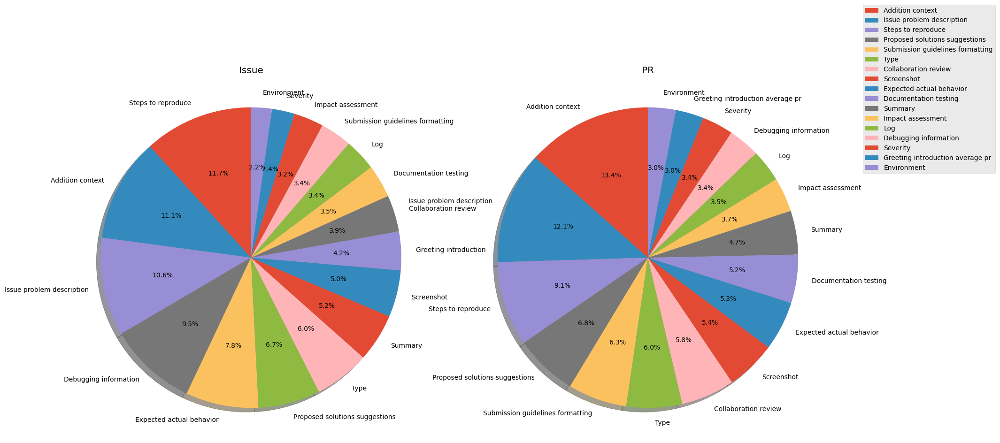

In [299]:
other_languages = ['Markdown', 'Jupyter Notebook', 'Shell', 'Clojure', 'None']

other_langs_score = {}
total_label_score = {}

overall_label_score = {}
overall_pr_score = {}

# Iterate over each language
for language in other_languages:
    other_langs_score[language] = lang_wise_scores[language]
    
    labels = [score[0] for score in other_langs_score[language]['issue']]
    scores = [score[1] for score in other_langs_score[language]['issue']]
    
    labels_pr = [score[0] for score in other_langs_score[language]['pr']]
    scores_pr = [score[1] for score in other_langs_score[language]['pr']]
    
    # Calculate the total score for each label
    for i in range(len(labels)):
        label = labels[i]
        score = scores[i]
        if label not in overall_label_score:
            overall_label_score[label] = 0
        overall_label_score[label] += score
    for i in range(len(labels_pr)):
        label = labels_pr[i]
        score = scores_pr[i]
        if label not in overall_pr_score:
            overall_pr_score[label] = 0
        overall_pr_score[label] += score

# Calculate the average score for each label
total_languages = len(other_languages)
for label in overall_label_score:
    overall_label_score[label] /= total_languages

for label in overall_pr_score:
    overall_pr_score[label] /= total_languages

# Sort the dictionary based on values
overall_label_score = sorted(overall_label_score.items(), key=lambda x: x[1], reverse=True)

overall_pr_score = sorted(overall_pr_score.items(), key=lambda x: x[1], reverse=True)

print("Overall Average Scores for All Labels: Issue")
print(overall_label_score)
print("Overall Average Scores for All Labels: PR")
print(overall_pr_score)

# plot two pie charts side by side

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')
# change font style
plt.rcParams['font.family'] = 'sans-serif'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.pie([score[1] for score in overall_label_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_label_score], autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

ax1.set_title('Issue')
ax2.pie([score[1] for score in overall_pr_score], labels=[score[0].replace('_', ' ').capitalize() for score in overall_pr_score], autopct='%1.1f%%', shadow=True, startangle=90)
ax2.axis('equal')
ax2.set_title('PR')
# put the legend on the right side and outside of the pie chart, not overlapping
ax2.legend(bbox_to_anchor=(1.15, 1.2), loc='upper left', borderaxespad=0.)
ax1.set_title('Issue')
ax2.set_title('PR')
ax1.axis('equal')
ax2.axis('equal')
plt.show()